# Анализ рынка общественного питания Москвы

**Цель: провести исследование рынка общественного питания Москвы для выбора наилучшего места для открытия нового заведения.**

**Задачи:**
- преодобработка файла (переименование, обработка пропусков и т.п.)
- анализ полученных данных и их визуализация
- углубленный анализ по кофейням (инвесторы склоняются к данному варианту, необходимо проработать вопрос более детально)
- общие выводы и рекомендации

**Описание исходных данных:**
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
  «Средний счёт: 1000–1500 ₽»;
  «Цена чашки капучино: 130–220 ₽»;
  «Цена бокала пива: 400–600 ₽».
   и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
</br>Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
</br>Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
</br>Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
</br>Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
</br>Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
</br>Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
</br>0 — заведение не является сетевым
</br>1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

## Предобработка данных

In [1]:
# импорт необходимых библиотек для анализа
import pandas as pd
import datetime as dt
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats as st
import math as mth
from pandas.plotting import register_matplotlib_converters
import warnings
warnings.filterwarnings('ignore')
register_matplotlib_converters()
from plotly import graph_objects as go
import plotly.express as px
import folium
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster
from folium import Map, Choropleth
import json

# при выводе датасетов установим отображение всех столбцов
pd.set_option('display.max_colwidth', None)

In [2]:
# считаем файл
try:
    df = pd.read_csv('moscow_places.csv')
except:
    df = pd.read_csv('https://raw.githubusercontent.com/dinomash/horeca_analysis_msc/main/moscow_places.csv')

In [3]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
# добавим функцию для поиску и удалению явных дубликатов
def duplicated_drop(df):
    print(f'Общее количество строк: {df.shape[0]}, общее количество столбцов: {df.shape[1]}')
    print(f'Удалено явных дубликатов: {df.duplicated().sum()}, что составляет {(df.duplicated().sum()/df.shape[0])*100}') #посчитаем количество явных дубликатов
    df = df.drop_duplicates().reset_index(drop=True) #удалим явные дубликаты

duplicated_drop(df)

Общее количество строк: 8406, общее количество столбцов: 14
Удалено явных дубликатов: 0, что составляет 0.0


In [5]:
# выведем общую информацию о типах данных в датасете
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Все названия колонок соотвествуют "змеиному регистру". Тип данных в только в количестве посадочных мест нуждается в изменении: маловероятно, что число мест будет дробным. При этом при наличии пропусков приведения данных к int невозможно. В связи с этим, оставим в формате float. Также, насколько видно из данных, имеются пропуски по некоторым категориям. 

In [6]:
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

В ходе анализа обнаружено большое количество пропусков. При этом замена их будет некорретной в связи с тем, что медианное или среднее значение цены, среднего чека, количества мест может изменяться в зависимости от расположения заведения, его типа и статуса и т.п.

Проверим ряд столбцов на явные дубликаты: category, address, district.

Так как адрес у нас состоит из названия города, улицы и дома, то при обработке адреса дополнительно добавим столбцы с разделенным городом, улицей и номером дома.

In [7]:
# проверим уникальные категории
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [8]:
# добавим столбец с улицами
df['street'] = df['address'].str.split(',').str[1]

In [9]:
# приведем названия и адреса к нижнему регистру
df['name'] = df['name'].str.lower()

# считаем количество неявных дубликатов
df.duplicated(subset=['name', 'address']).sum()

3

In [10]:
# удаляем неявные дубликаты
df = df.drop_duplicates(subset=['name', 'address'])

In [11]:
# добавим столбец с булевым значением работы заведения в круглосуточном режиме
df['is_24_7'] = df['hours'].str.contains('ежедневно, круглосуточно')

Проведем проверку аномальных значений по количеству посадочных мест. 

In [12]:
# выведем все данные по посадочным местам
df.groupby('category')['seats'].describe()

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
"бар,паб",467.0,124.477516,145.162278,0.0,48.0,82.0,148.5,1288.0
булочная,148.0,89.385135,97.685844,0.0,25.0,50.0,120.0,625.0
быстрое питание,349.0,98.891117,106.611739,0.0,28.0,65.0,140.0,1040.0
кафе,1217.0,97.365653,117.922464,0.0,35.0,60.0,120.0,1288.0
кофейня,751.0,111.199734,127.837772,0.0,40.0,80.0,144.0,1288.0
пиццерия,427.0,94.496487,112.282703,0.0,30.0,55.0,120.0,1288.0
ресторан,1269.0,121.892041,123.792216,0.0,48.0,86.0,150.0,1288.0
столовая,164.0,99.750000,122.951453,0.0,40.0,75.5,117.0,1200.0


In [13]:
# уточним наибольшее число посадочных мест по категориям
pd.pivot_table(df, values='seats',
                    index='category', aggfunc='max').round(0)

,seats
category,
"бар,паб",1288.0
булочная,625.0
быстрое питание,1040.0
кафе,1288.0
кофейня,1288.0
пиццерия,1288.0
ресторан,1288.0
столовая,1200.0


Согласно данным [статьи о самых больших заведениях Москвы](https://zoon.ru/msk/restaurants/award/10_samyh_bolshih_restoranov_moskvy/) наибольшее число посадочных мест обычно у банкетных залов в среднем это 500-800 персон при проведении фуршетов. Посмотрим наиболее крупные заведения с более чем 1200 посадочных мест. 

In [14]:
# выведем заведения с числом мест больше 1200
df.query('seats > 1200')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
6518,delonixcafe,ресторан,"Москва, проспект Вернадского, 94, корп. 1",Западный административный округ,"ежедневно, круглосуточно",55.652577,37.475730,4.1,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,0,1288.0,проспект Вернадского,True
6524,ян примус,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00–00:00",55.657166,37.481519,4.5,выше среднего,Средний счёт:1500 ₽,1500.0,NaN,1,1288.0,проспект Вернадского,False
6574,мюнгер,пиццерия,"Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.667505,37.491001,4.8,NaN,NaN,NaN,NaN,1,1288.0,проспект Вернадского,False
6641,one price coffee,кофейня,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,"ежедневно, 08:30–20:00",55.665129,37.478635,4.3,NaN,NaN,NaN,NaN,1,1288.0,проспект Вернадского,False
6658,гудбар,"бар,паб","Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 11:00–23:00; сб,вс 13:00–23:00",55.667327,37.490601,4.1,средние,Средний счёт:700 ₽,700.0,NaN,0,1288.0,проспект Вернадского,False
6684,пивной ресторан,"бар,паб","Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,NaN,55.657133,37.481508,4.5,NaN,NaN,NaN,NaN,0,1288.0,проспект Вернадского,NaN
6690,японская кухня,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,NaN,55.657255,37.481547,4.4,NaN,NaN,NaN,NaN,1,1288.0,проспект Вернадского,NaN
6771,точка,кафе,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,NaN,55.665634,37.477830,4.7,NaN,NaN,NaN,NaN,1,1288.0,проспект Вернадского,NaN
6807,loft-cafe академия,кафе,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,пн-пт 09:00–20:00; сб 09:00–16:00,55.665142,37.478603,3.6,NaN,NaN,NaN,NaN,0,1288.0,проспект Вернадского,False
6808,яндекс лавка,ресторан,"Москва, проспект Вернадского, 51, стр. 1",Западный административный округ,"ежедневно, круглосуточно",55.672580,37.507753,4.0,NaN,NaN,NaN,NaN,1,1288.0,проспект Вернадского,True


Интересно, что все заведения с количеством мест 1288 располагаются на улице проспект Вернадского. Также изучение некоторых из них в интернете показало, что вряд ли они обладают заявленным количеством указанных мест. Например, та же Яндекс Лавка указана в качестве ресторана и имеет число посадочных мест 1288, хотя формат этого не подразумевает. Скорее всего имеет место какая-то техническая ошибка конкретно по данной улице (так как номер дома одинаковый и это явно не фудкорт). В данном случае это не ошибочно поставленный ноль в конце, следовательно скорректировать арифметически данное отклонение невозможно. Удалим данные 11 заведений из датасета. 

In [15]:
df = df.query('seats <= 1200 | seats.isnull()')

Рассмотрим аномальные значения числа посадочных мест по категориям заведений. 

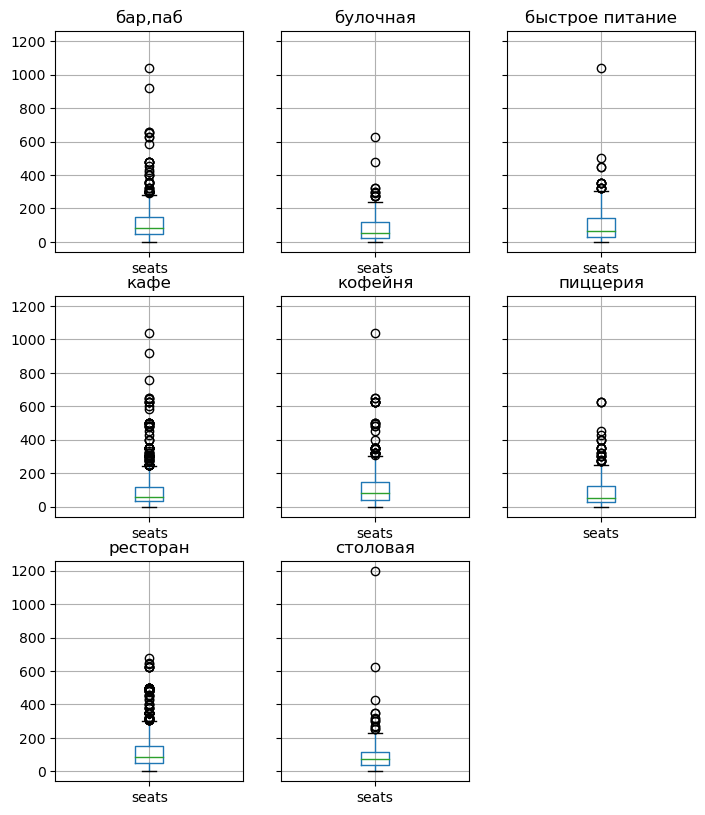

In [16]:
# построим боксплоты по местам
df[['category','seats']].groupby('category').boxplot(figsize=(8,10))
plt.show()

Как видно, по большинству заведений основное число посадочных мест не превышает 600. 

In [17]:
# выведем кафе с числом посадочных мест больше 600
df.query('seats > 600').count()


name                 42
category             42
address              42
district             42
hours                38
lat                  42
lng                  42
rating               42
price                16
avg_bill             19
middle_avg_bill      13
middle_coffee_cup     6
chain                42
seats                42
street               42
is_24_7              38
dtype: int64

Всего заведений с числом мест больше 600 выявлено 42, что составляет менее 1 процента от всего датасета. Также удалим такие заведения. 

In [18]:
# оставим в датасете заведения с количеством посадочных мест меньше 600
df = df.query('seats <= 600 | seats.isnull()')

Стоит отметить, что даже после удаления заведений с числом мест больше 600 у нас все равно остаются аномальные значения по каждой категории. Но так как их уже незначиельное количество, то удаление в данном случае будет излишним. Дополнительно при анализе будет использована медиана, чтобы избежать влияния аномальных выбросов. 

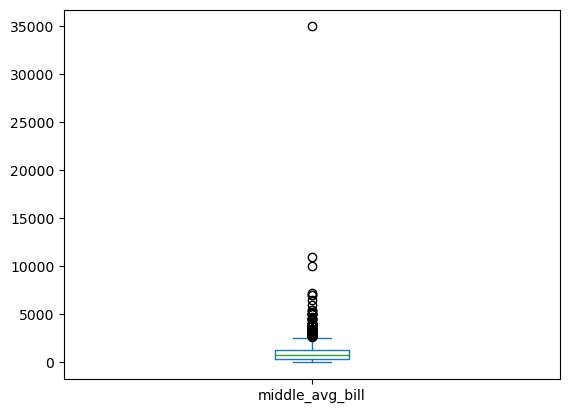

In [19]:
# выведем данные по распределению средних чеков
df['middle_avg_bill'].plot(kind='box')
plt.show()

In [20]:
# посчитаем 95 и 99 персентиль по среднему чеку
np.percentile(df.groupby(by='middle_avg_bill').sum(), [95, 99])

array([2183.30795275, 6993.25811483])

95 процентов средних чеков находятся в диапазоне до 2183 рублей. И только 1% чеков выше 6993 руб. 

In [21]:
# выведем заведения со средним чеком больше 6993 руб
df.query('middle_avg_bill > 6993')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
730,чойхона,"бар,паб","Москва, Дмитровское шоссе, 95А",Северный административный округ,"ежедневно, 10:00–23:00",55.871497,37.543555,4.4,высокие,Средний счёт:5000–17000 ₽,11000.0,NaN,0,49.0,Дмитровское шоссе,False
3396,марио,ресторан,"Москва, улица Климашкина, 17",Центральный административный округ,"ежедневно, 12:00–00:00",55.767792,37.568453,4.5,высокие,Средний счёт:7000 ₽,7000.0,NaN,0,100.0,улица Климашкина,False
3487,800°с contemporary steak,ресторан,"Москва, Большой Патриарший переулок, 6, стр. 1",Центральный административный округ,"ежедневно, 09:00–23:30",55.762708,37.592138,4.7,высокие,Средний счёт:6000–8000 ₽,7000.0,NaN,0,75.0,Большой Патриарший переулок,False
3882,white rabbit,ресторан,"Москва, Смоленская площадь, 3",Центральный административный округ,"ежедневно, 12:00–00:00",55.747608,37.581248,4.9,высокие,Средний счёт:7000–7500 ₽,7250.0,NaN,0,150.0,Смоленская площадь,False
5481,гости,ресторан,"Москва, шоссе Энтузиастов, 52",Восточный административный округ,"пн,вс 18:00–22:30",55.759088,37.760570,4.1,высокие,Средний счёт:5000–15000 ₽,10000.0,NaN,0,NaN,шоссе Энтузиастов,False
7177,кафе,ресторан,"Москва, Каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.657450,37.646665,4.1,высокие,Средний счёт:20000–50000 ₽,35000.0,NaN,0,100.0,Каширское шоссе,True


Заведения со средним чеком в 35 тыс.руб. кажутся не сильно правдоподобными (несмотря на то, что это Москва и цены значительно выше, чем по стране в целом). Также по указанному адресу располагается больница и маловероятно, что там находится элитный ресторан с таким высоким средним чеком. В связи с тем, что таких заведений всего 6, удалим их из общей выборки, чтобы они не оказывали существенного влияния на анализ среднего чека.

In [22]:
# удалим заведения со средним чеком больше 6993 руб
df = df.query('middle_avg_bill <= 6993 | middle_avg_bill.isnull()')
df.shape

(8344, 16)

**В результате предобработки обнаружено:**
- большое количество пропусков в некоторых столбцах (цена, средние чеки, количество мест), при этом не была произведена их замена, так как это бы исказило существующие данные
- отсутствуют явные пропуски
- было обнаружено и удалено три неявных пропуска
- добавлены столбцы с названиями улиц и булевым значением работы заведения в круглосуточном формате
- выявлены и удалены аномальные значения по количеству посадочных мест, среднему чеку

## Анализ данных

### Категории представленных заведений

In [23]:
# выведем уникальные категории
sorted(df['category'].unique())


['бар,паб',
 'булочная',
 'быстрое питание',
 'кафе',
 'кофейня',
 'пиццерия',
 'ресторан',
 'столовая']

Всего в данных представлено 8 категорий заведений. Построим визуализацию по по числу заведений в них.

In [24]:
# построим сводную таблицу по категориям заведений
category_pivot = pd.pivot_table(df, values='name',
                    index='category', aggfunc='count').sort_values(by='name', ascending=False)
category_pivot

,name
category,
кафе,2365
ресторан,2025
кофейня,1401
"бар,паб",754
пиццерия,629
быстрое питание,602
столовая,313
булочная,255


In [25]:
# визуализируем полученные данные
fig = go.Figure(data=[go.Pie(labels = category_pivot.index,
                values= category_pivot["name"],
                title='Заведения по категориям')])
fig.show()

Кафе и рестораны занимают наибольшую долю среди всех заведений Москвы: 28,3% и 24,3% соответственно. На третьем месте кофейни - их 16,8%. Самые малочисленные категории: столовые и булочные их доля в общем объеме составляет не более 4%.

### Количество посадочных мест по категориям заведений

In [26]:
# построим сводную таблицу по медианным значениям количества мест в заведениях
seats_pivot = pd.pivot_table(df, values='seats',
                    index='category', aggfunc='median').round(0).sort_values(by='seats', ascending=False)
seats_pivot

,seats
category,
ресторан,85.0
"бар,паб",80.0
кофейня,78.0
столовая,75.0
быстрое питание,65.0
кафе,60.0
пиццерия,52.0
булочная,50.0


In [27]:
# визуализируем полученные данные
fig = px.bar(seats_pivot, x=seats_pivot.index, y='seats', 
             title='Посадочные места по категориям заведений', labels={'category':'категория', 'seats':'посадочные места'},
            text="seats")
fig.update_xaxes(tickangle=45)
fig.show()

In [28]:
# уточним наибольшее число посадочных мест по категориям
pd.pivot_table(df, values='seats',
                    index='category', aggfunc='max').round(0)

,seats
category,
"бар,паб",585.0
булочная,478.0
быстрое питание,500.0
кафе,600.0
кофейня,500.0
пиццерия,455.0
ресторан,500.0
столовая,428.0


Медианное значение числа посадочных мест наибольшее в ресторанах - 86. В барах и пабах на чуть меньше - 80, примерно столько же в кофейнях - 78. Наименьшее значение в пиццериях и булочных - 52 и 50 соответственно. 

### Соотношение сетевых и несетевых заведений, их распределение по категориям

In [29]:
# посчитаем процент сетевых заведений в общем объеме
chain_perc = round((df['chain'].sum()/df['chain'].count())*100, 2)
chain_perc

38.08

Сетевые заведения занимают чуть больше трети (38%) в общем объеме. Рассмотрим подробнее распределение сетевых заведений по категориям.

In [30]:
# визуализируем полученные данные
fig = go.Figure(data=[go.Pie(labels=['Сетевые', 'Несетевые'], values=[chain_perc, 100-chain_perc], title='Соотношение сетевых и несетевых заведений')])
fig.show() 

In [31]:
# построим сводную таблицу с числом сетевых и несетевых заведений и их соотношение
chain_table = (df.groupby('category').agg({'chain':'sum', 'name':'count'})
               .sort_values(by='name', ascending=False)
               .rename(columns = {'name':'total'}))
chain_table['non_chain'] = chain_table['total'] - chain_table['chain']
chain_table['chain_from_all_perc'] = round((chain_table['chain']/chain_table['total'])*100, 1)

chain_table

,chain,total,non_chain,chain_from_all_perc
category,,,,
кафе,774,2365,1591,32.7
ресторан,721,2025,1304,35.6
кофейня,713,1401,688,50.9
"бар,паб",167,754,587,22.1
пиццерия,328,629,301,52.1
быстрое питание,231,602,371,38.4
столовая,87,313,226,27.8
булочная,156,255,99,61.2


In [32]:
# визуализируем полученные данные
chain_table = chain_table.sort_values(by='chain_from_all_perc', ascending=False)
fig = px.bar(chain_table, x=chain_table.index, y='chain_from_all_perc',
             text="chain_from_all_perc", 
             title='Процент сетевых заведений по категориям', labels={'chain_from_all_perc':'% сетевых заведений в категории', 'category':'категория'})
fig.update_xaxes(tickangle=45)
fig.show()

Наибольшее количество сетевых заведений в категориях булочная и пиццерия. Также много в Москве и сетевых кофеен. При этом бары и пабы отдают предпочтение отдельным заведениям без франшизы - в этой категории меньше всего сетевых заведений - 22%.

### Самые популярные сети Москвы

In [33]:
# сгруппируем заведения по названию и выведем 15 самых популярных
top_chains = (df.query('chain == 1').groupby(by=['name']).agg({'address':'count'})
              .sort_values(by='address', ascending=False)
              .rename(columns=({'address':'число заведений'})))
top_chains = top_chains.head(15)
top_chains

,число заведений
name,
шоколадница,118
домино'с пицца,76
додо пицца,74
one price coffee,70
яндекс лавка,68
cofix,65
prime,50
хинкальная,44
кофепорт,42


Самой популярной сетью является Шоколадница - 118 заведений в Москве. Как сказано в Википедии "Шоколадница — крупнейшая в России сеть кофеен, также присутствует в странах СНГ. Основана в Москве в 2000 году.". Не поспоришь, информация действительно подтверждается цифрами как минимум по Москве. 

In [34]:
# визуализируем полученные данные
fig = px.bar(top_chains, x=top_chains.index, y=top_chains['число заведений'],
             title='Топ-15 крупных сетей Москвы')
fig.update_xaxes(tickangle=45)
fig.show()

**Объединяющие признаки заведений:** большинство сетей являются известными и популярными не только в Москве, но и в регионах. Также большинство из них основаны еще в 2000-2010 гг. То есть данные сети находятся на рынке более 10 лет и выстояли уже не один экономический кризис, доказав свою успешность. Посмотрим к каким категориям заведений относятся данные сети. 

In [35]:
# построим сводную таблицу по популярным заведениям обобщенно по категориям
chain = df.query('chain == 1 & name in @top_chains.index').groupby(by='category').agg({'address':'count'})

In [36]:
# визуализируем полученные данные
fig = go.Figure(data=[go.Pie(labels=chain.index, values=chain['address'], title='Категории популярных сетей')])
fig.show() 

Наиболее популярной категорией среди известных сетевых заведений являются кофейни - чуть меньше половины (41%), второе и третье место с небольшим отрывом делят между собой ресторан и пиццерия. 

### Распределение категорий заведений по районам Москвы

In [37]:
# построим сводную таблицу по районам и категориям в них
district_pivot = pd.pivot_table(df, values='address', index='district', columns='category', aggfunc='count')
district_pivot

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,50,25,70,270,104,72,159,40
Западный административный округ,46,37,62,233,146,70,213,23
Северный административный округ,65,38,58,231,186,74,183,40
Северо-Восточный административный округ,62,28,82,269,159,68,182,40
Северо-Западный административный округ,23,12,30,115,62,40,109,18
Центральный административный округ,364,50,87,464,428,113,667,66
Юго-Восточный административный округ,38,13,67,282,89,55,145,25
Юго-Западный административный округ,38,27,61,237,96,64,167,17
Южный административный округ,68,25,85,264,131,73,200,44


In [38]:
# визуализируем полученные данные
fig = px.bar(district_pivot, x=district_pivot.columns, y=district_pivot.index,
             title='Категории по районам Москвы',
             labels={'district':'район Москвы', 'value':'количество заведений'},
            text='value')
fig.update_xaxes(tickangle=45)
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

Наибольшее количество заведений сосредоточено в Центральном округе Москвы: москвичи и гости столицы предпочитают посещать рестораны, чем и рождают значительное предложение среди данных заведений. Также так как в центре сосредоточено много офисов, то популярностью пользуются и кофейни: в 4 раза больше, чем в других районах Москвы. Меньше всего заведений общественного питания в Северо-Западном административном округе. 

### Распределение рейтингов по категориям заведений

In [39]:
# построим таблицу по средним рейтингам по категориям
rating = df.groupby(by='category').agg({'rating':'median'}).sort_values(by='rating', ascending=False).round(2)
rating

,rating
category,
"бар,паб",4.4
булочная,4.3
кофейня,4.3
пиццерия,4.3
ресторан,4.3
столовая,4.3
быстрое питание,4.2
кафе,4.2


In [40]:
# визуализируем полученные данные
fig = px.bar(rating, x=rating.index, y=rating.columns,
             title='Средний рейтинг по категориям', 
             labels={'category':'категория', 'value':'средний рейтинг'}, 
            text='value')
fig.update_xaxes(tickangle=45)
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

Самый высокий средний рейтинг у баров и пабов - практически 4.4. Возможно алкоголь каким-то образом оказывает влияние на расположение посетителей и они не скупятся на оценки. По всем остальным категориям рейтинг находится на уровне 4.3. Аутсайдерами рейтинга являются кафе и заведения быстрого питания 4.2. Скорее всего формат таких заведений не предполагает долгих застолий, а также внимание к каждому посетителю и впечатление от сервиса может быть хуже, чем в других местах с более размеренным темпом обслуживания и индивидуальным подходом.

### Распределение рейтингов по районам Москвы

In [41]:
# сгруппируем заведения по районам и рейтингу
rating_df = df.groupby('district', as_index=False)['rating'].agg('median').sort_values(by='rating', ascending=False)
rating_df

,district,rating
5,Центральный административный округ,4.4
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
4,Северо-Западный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
3,Северо-Восточный административный округ,4.2
6,Юго-Восточный административный округ,4.2


In [42]:
# читаем файл с границами карты и сохраняем в переменной
try:
    with open('admin_level_geomap.geojson', 'r') as f:
        state_geo = json.load(f)
except:
    with open('https://raw.githubusercontent.com/dinomash/horeca_analysis_msc/main/admin_level_geomap.geojson', 'r') as f:
        state_geo = json.load(f)



In [43]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Наибольший рейтинг в центральном административном округе (4.4). Ниже всего посетители оценили заведения в Северо-Восточном и Юго-Восточном административных округах (4.2). 

### Карта заведений Москвы

In [44]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

### Самые популярные улицы Москвы

In [45]:
# найдем улицы с наибольшим количеством заведений на них и оставим топ-15
top_street = df.groupby(by='street').agg({'address':'count'}).sort_values(by='address', ascending=False).head(15)
top_street


,address
street,
проспект Мира,183
Профсоюзная улица,122
Ленинский проспект,107
проспект Вернадского,97
Дмитровское шоссе,87
Каширское шоссе,76
Варшавское шоссе,76
Ленинградский проспект,72
Ленинградское шоссе,70


In [46]:
# сгруппируем данные по количеству заведений на улицах и выведем 15 самых популярных
street_pivot = (pd.pivot_table(df.query('street in @top_street.index')
                               , values='address', index='street', columns='category', aggfunc='count'))

street_pivot

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
Алтуфьевское шоссе,5.0,1.0,5.0,13.0,9.0,3.0,10.0,1.0
Варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0
Дмитровское шоссе,5.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
Каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,18.0,5.0
Кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,16.0,2.0
Ленинградский проспект,13.0,3.0,2.0,8.0,18.0,6.0,20.0,2.0
Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0
Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
Люблинская улица,5.0,NaN,5.0,26.0,11.0,1.0,10.0,2.0


In [47]:
# визуализируем полученные данные
fig = px.bar(street_pivot, x=street_pivot.columns, y=street_pivot.index,
             title='Наиболее популярные улицы Москвы', 
             labels={'street':'улица', 'value':'количество заведений'}, text='value')
fig.update_xaxes(tickangle=45)
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

Самой популярной улицей является проспект Мира - 183 заведения, из которых половина приходится на кафе и рестораны. Меньше всего на популярных улицах столовых (не более 7). Замыкает рейтинг топ-15 популярных улиц Алтуфьевское шоссе - 47 заведений чуть меньше половины которых кафе и рестораны.

### Самые непопулярные улицы Москвы

In [48]:
# сгруппируем данные по количеству заведений на улицах и выведем улицы с 1м заведением на ней
alone_street = df.merge(df.groupby('street')['name'].count().rename('is_alone') == 1, on='street')
alone_street = alone_street.query('is_alone == True')
alone_street

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7,is_alone
190,дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False,True
277,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False,True
283,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False,True
284,coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False,True
288,чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник Лианозовский,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8330,мираж,ресторан,"Москва, улица Шкулёва, 2А",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,NaN,NaN,0,90.0,улица Шкулёва,False,True
8331,wtfcoffee,кофейня,"Москва, улица Артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,0,NaN,улица Артюхиной,False,True
8335,беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,1,NaN,Кузьминская улица,False,True
8342,лагман хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,1,40.0,Новороссийская улица,False,True


In [49]:
alone_street.groupby('district', as_index=False)['address'].agg('count').sort_values(by='address', ascending=False)

,district,address
5,Центральный административный округ,144
3,Северо-Восточный административный округ,55
0,Восточный административный округ,52
2,Северный административный округ,52
8,Южный административный округ,43
6,Юго-Восточный административный округ,39
1,Западный административный округ,35
4,Северо-Западный административный округ,19
7,Юго-Западный административный округ,18


In [50]:
# визуализируем распределение заведений по категориям
alone_street_cat = alone_street.groupby('category', as_index=False)['address'].agg('count')
fig = go.Figure(data=[go.Pie(labels=alone_street_cat['category'], values=alone_street_cat['address'], title='Категории одиночных заведений на непопулярных улицах')])
fig.show() 

Всего было обнаружено 457 улиц с единственным заведением на них. Большинство улиц с единственным заведением располагаются в ЦАО, как и большинство заведений из общих данных. Следовательно, трафик в ЦАО настолько большой, что даже на небольших улицах открытие отдельных заведений является оправданным. Больше всего на таких улицах кафе, чуть меньше ресторанов и кофеен. 

### Средний чек по районам Москвы

In [51]:
# сгруппируем заведения по районам и рейтингу
avg_bill = df.groupby('district', as_index=False)['middle_avg_bill'].agg('median').sort_values(by='middle_avg_bill', ascending=False)
avg_bill

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,550.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [52]:
# визуализируем полученные данные
fig = px.bar(avg_bill, x=avg_bill['middle_avg_bill'], y=avg_bill['district'],
             title='Средний чек по районам Москвы', 
             text = avg_bill['middle_avg_bill'],
             labels={'middle_avg_bill':'средний чек', 'district':'район'})
fig.update_xaxes(tickangle=45)
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

In [53]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек по заведениям',
).add_to(m)

# выводим карту
m

Наибольший средний чек в Центральном и Западном административных округах - 1000 руб. Северо-Восточный, Юго-Восточный и Южный административные округа имеют наиболее низкие средние чеки (в два раза ниже чем в центральных районах) 450-500 руб. Скорее всего в данных округах располагаются спальные районы, где кафе и рестораны рассчитаны на средних потребителей, живущих недалеко. Центральные же районы в основном рассчитаны как на офисных работников (бизнес-ланчи, деловые обеды, ужины), так и на туристов, которые не поедут в другие районы ради более дешевых услуг. Также средний чек и уровень заведений определяется трафиком - в центральных районах он выше. Как следствие, чем выше трафик, а значит и спрос, тем больше предложение и уровень цен.

## Выводы по двум разделам

**1. Предобработка и первичный анализ**

- Исходные данные представлены по 8406 заведениям Москвы. 
- Были обнаружены пропуски по цене, среднему чеку, количеству посадочных мест, средней стоимости чашки кофе. Замены не проводились для избежания искажения данных.
- В столбцах "число посадочных мест" и "средний чек" были обнаружены аномальные значения, которые были удалены из датасета. 
- Обнаружено и удалено 3 неявных дубликата строк.
- Общее количество заведений после преобработки составило 8344, что составляет 99% от первоначального датасета.



**2. Общий анализ заведений общественного питания**
- Категории представленных заведений: 'бар,паб',
 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая'
- Кафе и рестораны занимают наибольшую долю среди всех заведений Москвы: 28,3% и 24,3% соответственно. На третьем месте кофейни - их 16,8%. Самые малочисленные категории: столовые и булочные их доля в общем объеме составляет не более 4%.
- Медианное значение числа посадочных мест наибольшее в ресторанах - 86. В барах и пабах чуть меньше - 80, примерно столько же в кофейнях - 78. Наименьшее значение в пиццериях и булочных - 52 и 50 соответственно. 
- Сетевые заведения занимают чуть больше трети (38%) в общем объеме. 
- Самой популярной сетью является Шоколадница - 118 заведений в Москве. Далее - Доминос пицца и Додо пицца по 77 и 74 заведения соотвественно.
- Среди популярных сетей чаще всего встречаются кофейни (41%), на втором и третьем месте (практически по 20%) рестораны и пиццерии. 
- Общие черты сетей: являются известными и популярными не только в Москве, но и в регионах, основаны еще в 2000-2010 гг. То есть данные сети находятся на рынке более 10 лет и выстояли уже не один экономический кризис, доказав свою успешность.
- Наибольшее количество заведений сосредоточено в Центральном округе Москвы: москвичи и гости столицы предпочитают посещать рестораны, чем и рождают значительное предложение среди данных заведений. Также так как в центре сосредоточено много офисов, то популярностью пользуются и кофейни: в 4 раза больше, чем в других районах Москвы. Меньше всего заведений общественного питания в Северо-Западном административном округе. 
- Самый высокий средний рейтинг у баров и пабов - практически 4.4. Возможно алкоголь каким-то образом оказывает влияние на расположение посетителей и они не скупятся на оценки. По всем остальным категориям рейтинг находится на уровне 4.3. Аутсайдерами рейтинга являются кафе и заведения быстрого питания 4.2. Скорее всего формат таких заведений не предполагает долгих застолий, а также внимание к каждому посетителю и впечатление от сервиса может быть хуже, чем в других местах с более размеренным темпом обслуживания и индивидуальным подходом.
- Наибольший рейтинг в центральном административном округе (4.4). Ниже всего посетители оценили заведения в Северо-Восточном и Юго-Восточном административных округах (4.2). 
- Самой популярной улицей является проспект Мира - 183 заведения, из которых половина приходится на кафе и рестораны. Меньше всего на популярных улицах столовых (не более 7). Замыкает рейтинг топ-15 популярных улиц Алтуфьевское шоссе - 47 заведений чуть меньше половины которых кафе и рестораны.
- Всего было обнаружено 457 улиц с единственным заведением на них. Большинство улиц с единственным заведением располагаются в ЦАО, как и большинство заведений из общих данных. Следовательно, трафик в ЦАО настолько большой, что даже на небольших улицах открытие отдельных заведений является оправданным. Больше всего на таких улицах кафе, чуть меньше ресторанов и кофеен. 
- Наибольший средний чек в Центральном и Западном административных округах - 1000 руб. Северо-Восточный, Юго-Восточный и Южный административные округа имеют наиболее низкие средние чеки (в два раза ниже чем в центральных районах) 450-500 руб. Скорее всего в данных округах располагаются спальные районы, где кафе и рестораны рассчитаны на средних потребителей, живущих недалеко. Центральные же районы в основном рассчитаны как на офисных работников (бизнес-ланчи, деловые обеды, ужины), так и на туристов, которые не поедут в другие районы ради более дешевых услуг. Также средний чек и уровень заведений определяется трафиком - в центральных районах он выше. Как следствие, чем выше трафик, а значит и спрос, тем больше предложение и уровень цен.

**3. Описание типичного заведения общественного питания в Москве**

Кафе, кофейня или ресторан от 60 до 80 посадочных мест, не сетевое, находится в Центральном административном округе Москвы и имеет средний чек 1000 руб. Скорее всего расположено на большой улице с высоким трафиком (близко к туристическим достопримечательностям или офисам). Имеет рейтинг не выше 4.4. 

# Детализированный анализ кофеен Москвы

Инвесторы склоняются к варианту открытия кофейни. Для более детального анализа сформируем новый датафрейм с кофейнями. Проанализируем: количество кофеен, их распределение по районам, средний чек и среднюю стоимость чашки кофе, а также их рейтинги и количество посадочных мест.

In [54]:
# сформируем датасет по кофейням
dfc = df.query('category == "кофейня"')
dfc.shape

(1401, 16)

Всего у нас имеется информация по 1401 кофейне. Рассмотрим их особенности детальнее.

## Распределение кофеен по районам

In [55]:
# сгруппируем кофейни по районам
district_cof = dfc.groupby('district', as_index=False)['address'].agg('count').sort_values(by='address', ascending=False)
district_cof

,district,address
5,Центральный административный округ,428
2,Северный административный округ,186
3,Северо-Восточный административный округ,159
1,Западный административный округ,146
8,Южный административный округ,131
0,Восточный административный округ,104
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [56]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
dfc.apply(create_clusters, axis=1)

# выводим карту
m

In [57]:
# визуализируем полученные данные
fig = go.Figure(data=[go.Pie(labels = district_cof['district'],
                values=district_cof['address'],
                title='Кофейни в районах Москвы')])
fig.show()

Значительное количество кофеен сосредоточено в Центральном административном округе 428 заведений. Во всех остальных районах практически в 2-3 раза меньше. Это обуславливается спецификой категории: в основном потребители кофе это сотрудники офисов, которые расположены в деловом центральном районе, а также туристы, зашедшие выпить чашку кофе, чтобы сделать паузу в долгих прогулках по историческому центру.  

## Улицы с наибольшим количеством кофеен

In [58]:
# найдем топ-15 улиц с наибольшим числом кофеен
street_cof = (dfc.groupby('street', as_index=False)['address']
              .agg('count').sort_values(by='address', ascending=False)
              .head(15))
street_cof

,street,address
476,проспект Мира,36
214,Ленинский проспект,23
331,Профсоюзная улица,18
212,Ленинградский проспект,18
178,Каширское шоссе,16
474,проспект Вернадского,14
120,Варшавское шоссе,14
207,Кутузовский проспект,13
284,Новослободская улица,13
213,Ленинградское шоссе,13


In [59]:
# визуализируем полученные данные
fig = px.bar(street_cof, x=street_cof['street'], y=street_cof['address'],
             title='Улицы с большим числом кофеен', 
             text=street_cof['address'],
             labels={'street':'улица', 'address':'количество заведений'})
fig.update_xaxes(tickangle=45)
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

In [60]:
# найдем медиану заведений по топ-15 улицам
street_cof['address'].median()

13.0

Наибольшее число кофеен представлено на Проспекте Мира - 36 шт. Затем идет Ленинский проспект (23) и Профсоюзная улица с Ленинградским проспектом (18). При этом медианное значение по топ-15 улицам на уровне 13. На наш взгляд открывать кофейню стоит на топовых улицах, по которым проходит большой трафик, имеется здоровая конкуренция, при этом в местах, которые еще не перенасыщены данными заведениями. Для открытия кофейни подойдет Кутузовский проспект, Новослободская улица, Ленинградское шоссе. 

## Наличие круглосуточного режима работы

In [61]:
# найдем кофейни с круглосуточным режимом работы по районам
all_dayd = (dfc.groupby('district', as_index=False)
              .agg({'address':'count', 'is_24_7':'sum'}).sort_values(by='address', ascending=False)
              .head(15))
all_dayd['perc_from_total'] = round(((all_dayd['is_24_7']/all_dayd['address'])*100).astype('float'), 2)
all_dayd

,district,address,is_24_7,perc_from_total
5,Центральный административный округ,428,26,6.07
2,Северный административный округ,186,5,2.69
3,Северо-Восточный административный округ,159,3,1.89
1,Западный административный округ,146,9,6.16
8,Южный административный округ,131,1,0.76
0,Восточный административный округ,104,5,4.81
7,Юго-Западный административный округ,96,7,7.29
6,Юго-Восточный административный округ,89,1,1.12
4,Северо-Западный административный округ,62,2,3.23


In [62]:
# визуализируем полученные данные
fig = px.bar(all_dayd, x=all_dayd['perc_from_total'], y=all_dayd['district'],
             title='Процент круглосуточных кофеен', 
             text=all_dayd['perc_from_total'],
             labels={'district':'район', 'perc_from_total':'процент от общего числа кофеен'})
fig.update_xaxes(tickangle=45)
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

Юго-Западный район "самый неспящий" - 7 процентов круглосуточных кофеен. В Южном административном округе предпочитают ночью не употреблять бодрящие напитки - там не найдется даже одного процента круглосуточных кофеен. Таким образом, при открытии кофейни можно смело не работать ночью. 

In [63]:
# найдем кофейни с круглосуточным режимом работы на топовых улицах
all_day = (dfc.groupby('street', as_index=False)
              .agg({'address':'count', 'is_24_7':'sum'}).sort_values(by='address', ascending=False)
              .head(15))
all_day

,street,address,is_24_7
476,проспект Мира,36,0
214,Ленинский проспект,23,3
331,Профсоюзная улица,18,1
212,Ленинградский проспект,18,2
178,Каширское шоссе,16,0
474,проспект Вернадского,14,1
120,Варшавское шоссе,14,0
207,Кутузовский проспект,13,3
284,Новослободская улица,13,0
213,Ленинградское шоссе,13,0


Практически никакие кофейни на топовых улицах не имеют круглосуточного режима работы. Это и логично: желающих пить кофе ночью очень мало. 

## Соотношение сетевых и несетевых кофеен

In [64]:
# посчитаем процент сетевых кофеен
(dfc['chain'].sum()/dfc.shape[0])*100

50.89221984296931

In [65]:
# посмотрим на основные сети кофеен
chain_c = dfc.query('chain == 1').groupby('name', as_index=False).agg({'address':'count'}).sort_values('address', ascending=False)
chain_c

,name,address
155,шоколадница,117
59,one price coffee,70
32,cofix,65
116,кофепорт,42
13,cofefest,31
...,...,...
82,алёнка,1
120,лагман,1
121,маковка,1
123,мельница,1


In [66]:
chain_c = chain_c.head(10)

# визуализируем полученные данные
fig = px.bar(all_dayd, x=chain_c['address'], y=chain_c['name'],
             title='10 основных сетей-конкурентов', 
             text=chain_c['address'],
             labels={'y':'название сети', 'x':'количество заведений'})
fig.update_xaxes(tickangle=45)
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

Соотношение сетевых/несетевых заведений в кофейнях значительно выше уровня остального общепита. Более 51% приходится на сетевые заведения. В основном за счет Шоколадницы, которая имеет 117 кофеен в Москве.

При открытии кофейни можно попробовать сделать кофейню по индивидуальному проекту, при этом стоит учитывать, что конкуренция значительно выше и сетевые кофейни чаще всего имеют больше маркетинговых, финансовых и административных ресурсов для более успешной деятельности на долгую дистанцию. Как вариант можно рассмотреть покупку франшизы одной из крупных сетей. 

## Рейтинги кофеен

In [67]:
# сгруппируем заведения по районам и рейтингу
rating_c = dfc.groupby('district', as_index=False)['rating'].agg('median').sort_values(by='rating', ascending=False)
rating_c

,district,rating
0,Восточный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
6,Юго-Восточный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
1,Западный административный округ,4.2


In [68]:
# найдем число кофеен с рейтингом 5 по районам
dfc.query('rating == 5').groupby('district', as_index=False)['rating'].agg('count').sort_values(by='rating', ascending=False)

,district,rating
2,Северный административный округ,13
5,Центральный административный округ,5
0,Восточный административный округ,4
4,Северо-Западный административный округ,4
6,Юго-Восточный административный округ,4
1,Западный административный округ,3
8,Южный административный округ,2
3,Северо-Восточный административный округ,1
7,Юго-Западный административный округ,1


Средний рейтинг кофеен очень однороден - практически по всем районам он равен 4.3. При этом наибольшее число кофеен с рейтингом 5 находится в Северном административном округе. Так как эта ситуация практически нереальна, можем сказать, что либо эти заведения открылись недавно и рейтинг сформирован искусственно (друзья, знакомые владельцев написали отзывы), либо данные кофейни действительно обладают каким-либо конкурентным преимуществом, которое можно будет изучить и перенять при открытии собственного заведения. 

## Средняя стоимость чашки кофе

In [69]:
# сгруппируем заведения по районам и средней стоимости чашки кофе, среднего чека
cof_price = dfc.groupby('district', as_index=False)['middle_coffee_cup', 'middle_avg_bill'].agg('median').sort_values(by='middle_coffee_cup', ascending=False)
cof_price

,district,middle_coffee_cup,middle_avg_bill
7,Юго-Западный административный округ,198.0,375.0
5,Центральный административный округ,190.0,500.0
1,Западный административный округ,187.0,600.0
4,Северо-Западный административный округ,165.0,325.0
3,Северо-Восточный административный округ,162.5,325.0
2,Северный административный округ,159.0,325.0
8,Южный административный округ,150.0,387.5
6,Юго-Восточный административный округ,147.5,250.0
0,Восточный административный округ,135.0,400.0


In [70]:
# визуализируем полученные данные
fig = px.bar(cof_price, x=cof_price.columns, y=cof_price['district'],
             title='Средняя стоимость чашки кофе/средний чек', 
             labels={'district':'район', 'value':'средняя стоимость'}, text='value')
fig.update_xaxes(tickangle=45)
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

При открытии кофейни в Центральном, Западном и Юго-Западных административных районах справедливая цена на чашку кофе будет в размере 187-200 рублей. При этом, стоит отметить, что помимо чашки кофе стоит также ориентироваться на общий средний чек: он наиболее высокий как раз в Западном и Центральном административных районах. Следовательно, посетители берут не только кофе на вынос, но еще и дополнительные товары: десерты, сендвичи, небольшие блюда to-go формата. При открытии кофейни в этих районах возможно также добавить в меню сопутствующие товары, что увеличит средний чек, а следовательно и общую выручку кофейни.

## Выводы по анализу кофеен

**Выводы по анализу:**

Была проанализирована 1401 кофейня в Москве. 
- Наибольшее число кофеен в Центральном административном округе - 428 шт. Во всех остальных районах практически в 2-3 раза меньше. 
- Наибольшее число кофеен представлено на Проспекте Мира - 36 шт. Затем идет Ленинский проспект (23) и Профсоюзная улица с Ленинградским проспектом (18). При этом медианное значение по топ-15 улицам на уровне 13. 
- Кругосуточный режим кофейни встречается максимум у 7% всех заведений района. В остальных количество круглосуточных кофеен около 5%. 
- Половина кофеен - сетевые. Основной сетевой конкурент - Шоколадница (117), затем One price coffee (70) и Cofix (65).
- Средний рейтинг кофеен 4.3. Количество кофеен с рейтингом 5 - менее одного процента из всех данных. 
- Наиболее высокая средняя стоимость чашки кофе в Юго-Западном административном округе (198 руб.). В зависимости от района цена чашки кофе отличается. Также имеется районная специфика: в ряде районов посетитель предпочитает брать только кофе, в других же еще и сопутствующие товары.

**Рекомендации по открытию кофейни:**

- Благоприятные районы для открытия: Центральный и Западный административные округа. Причины: высокая стоимость чашки кофе + высокий общий средний чек (посетители берут дополнительные продукты, тем самым увеличивая выручку). Также наличие большого количества заведений: имеется спрос на кофейни, находятся в районах большого трафика (деловой и туристический центры).
- Средняя стоимость чашки кофе - 185-195 рублей.
- Число посадочных мест 70-80.
- Возможно рассмотреть открытие франшизного (сетевого) заведения т.к. имеют опыт и ресурсы для ведения успешного бизнеса. 
- Необходимо наличие дополнительных товаров - блюд навынос, десертов для увеличения среднего чека.
- Открытие круглосуточной кофейни может быть неоправдано, что подтверждается низкой долей заведений с таким режимом работы. 
- Необходимо провести дополнительный анализ конкурентов для выявления их сильных и слабых сторон (Шоколадница, One price coffee, Cofix).	
    